In [1]:
import sys
#add directory to path to allow importing of modules if not already in path
if "/home/d.gaillard/source/NIPTov-analysis-tools" not in sys.path:
    sys.path.append("/home/d.gaillard/source/NIPTov-analysis-tools")


import WCR_analysis_tools
from importlib import reload
reload(WCR_analysis_tools)
from WCR_analysis_tools import *

In [2]:
from pathlib import Path
base = Path('/home/d.gaillard/paired_ovarian/fragment_lengh_distibution/binwise_fragmentomics')


# get label data
label_df = pd.read_csv('/home/d.gaillard/paired_ovarian/label_data/labels.csv')
label_df = label_df.set_index('PGDXID')
labels = label_df.loc[:, 'Lesion_Type']
data = {}

for file in base.glob('*b250000_*.csv'):
    # get label
    PGDXID = file.stem.split('_')[0]
    lab = labels.loc[PGDXID]
    data[PGDXID] = {'label': lab}

    # read file
    df = pd.read_csv(file, sep='\t')
    data[PGDXID]['df'] = df
    

In [3]:
import pandas as pd

processed_data = {} # same structure as data

for PGDXID in data.keys():
    lab = data[PGDXID]['label']
    processed_data[PGDXID] = {'label': lab}

    # create new df
    df = data[PGDXID]['df']
    df2 = pd.DataFrame()

    # copy some columns from df to df2
    df2['contig'] = df['contig']
    df2['start'] = df['start']
    df2['end'] = df['end']
    df2['mean_fragment_length'] = df['mean_fragment_length']
    df2['delta_score'] = df['delta_score']
    df2['total_reads'] = df['total_reads']

    # comvert columns to ratios
    df2['mate_unmapped_ratio'] = df['mate_unmapped_reads']/df['total_reads']
    df2['supplementary_ratio'] = df['supplementary_alignments']/df['total_reads']
    df2['extreme_read_length_ratio'] = df['extreme_fragment_lengths']/df['total_reads']
    df2['incorrect_orientation_ratio'] = df['incorrect_orientation_reads']/df['total_reads']


    ## merge df2 and df_cnv
    # determine path to cnv file based on label and PGDXID
    if lab.lower() == 'malignant':
        cnv_file = f'/home/d.gaillard/paired_ovarian/snakemake-wisecondorx-loocv/output_folder/outfiles/malignant/{PGDXID}_WGS_hg19_mrk_b250000_ref_benign_bins.bed'
    elif lab.lower() == 'benign':
        cnv_file = f'/home/d.gaillard/paired_ovarian/snakemake-wisecondorx-loocv/output_folder/outfiles/benign/{PGDXID}_WGS_hg19_mrk_b250000_looref_bins.bed'
    df_cnv = pd.read_csv(cnv_file, sep='\t')

    # merge df2 and df_cnv
    df2['cnv_ratio'] = df_cnv['ratio']
    df2['cnv_zscore'] = df_cnv['zscore']

    # remove chrY 
    df2 = df2[df2['contig'] != 'chrY']

    # add df2 to processed_data
    processed_data[PGDXID]['df'] = df2

data = processed_data

In [4]:
def align_yaxes(ax1, ax2):
    # get limits
    y_lims = [ax.get_ylim() for ax in [ax1, ax2]]

    # take extreme values for limits
    y_min = min([y[0] for y in y_lims])
    y_max = max([y[1] for y in y_lims])

    # set limits
    ax1.set_ylim(y_min, y_max)
    ax2.set_ylim(y_min, y_max)

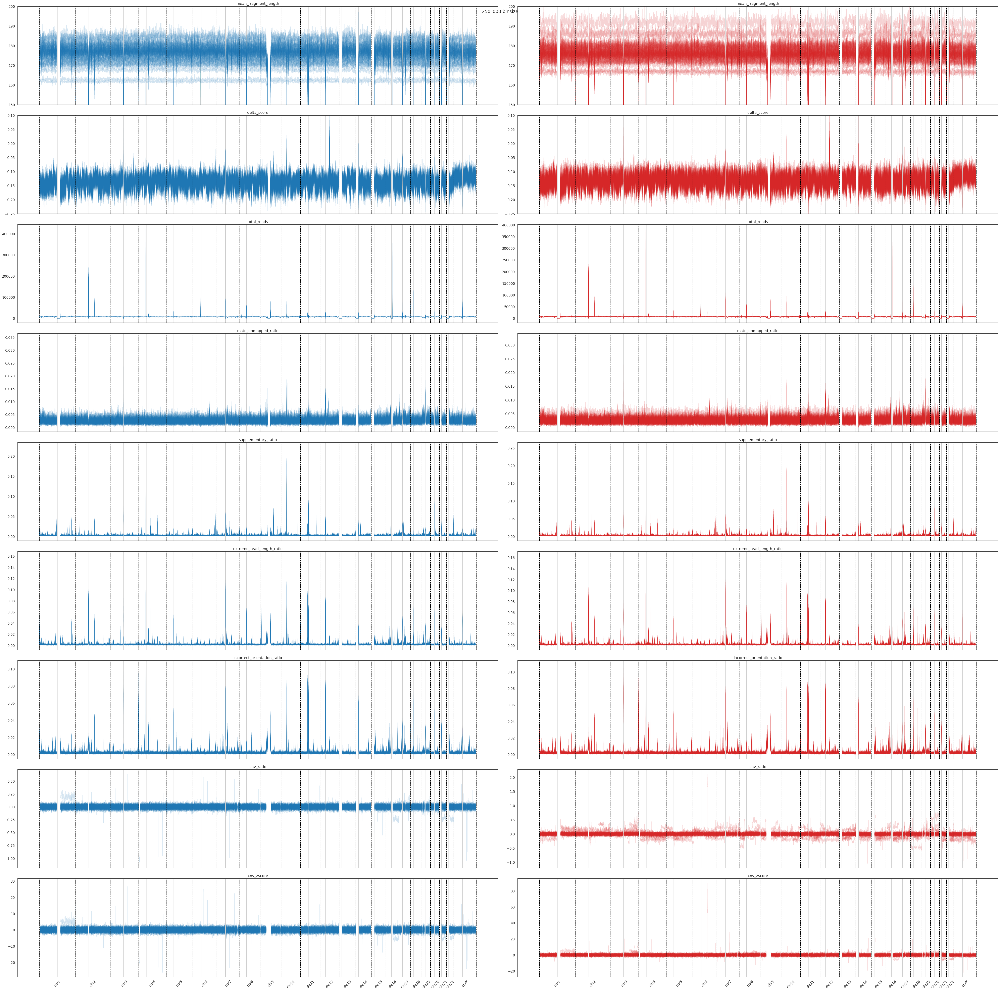

In [5]:

# code to plot all features 

# first deterime how many subplots we need under each other. 1 per feature
df1 = data[list(data.keys())[0]]['df']
features = df1.columns[3:].tolist()
fig, axs = plt.subplots(len(features), 2, figsize=(50, 50), sharex=True)

for i, feature in enumerate(features):
    for ax in axs[i, :]:
        ax.set_title(feature)
    for PGDXID in data.keys():
        df = data[PGDXID]['df']
        label = data[PGDXID]['label']
        if label == 'Malignant':
            is_malignant = 1
            color = 'tab:red'
        else:
            is_malignant = 0
            color = 'tab:blue'

        vector = df.loc[:, feature].values
        axs[i, is_malignant].plot(vector, alpha=0.2, color=color, linewidth=0.5)

#next for labeling the xaxis we need to know the number of bins for each chromosome.
# count the number of occurences of each chromosome in the sample_dfs[0]
chromosome_counts = df1.iloc[:, 0].value_counts().to_dict()
chromosome_ordered = df1.iloc[:, 0].unique().tolist()

# cumulatively sum the counts to get the end of each chromosome
chromosome_ends = np.cumsum([chromosome_counts[chromosome] for chromosome in chromosome_ordered])
chromosome_ends = np.insert(chromosome_ends, 0, 0)

# plot the chromosome ends as vertical lines over all the subplots
for chromosome_end in chromosome_ends:
    for ax in axs.ravel():
        ax.axvline(chromosome_end, color='black', linestyle='--')

# now we can plot the xaxis labels between the start and the end of each chromosome
# the start is the previous chromosome end, and the end is the current chromosome end using xtick labels
# set xticks to the middle of each chromosome
xticks = [(chromosome_ends[i] + chromosome_ends[i+1])/2 for i in range(len(chromosome_ends)-1)]
# set xtick labels to the chromosome names
xtick_labels = chromosome_ordered
# set xticks and xtick labels for each subplot
for ax in axs.ravel():
    ax.set_xticks(xticks)
    ax.set_xticklabels(xtick_labels, rotation=45)

## load centromere data
centromere_df = pd.read_csv('/home/d.gaillard/paired_ovarian/fragment_lengh_distibution/data/hg19_centromere.bed', sep='\t', header=None)
# drop last column
centromere_df = centromere_df.iloc[:, :-1]
# rename columns
centromere_df.columns = ['chromosome', 'start', 'end']

# draw lightgrey rectangles over the centromere regions for each chromosome first determine which bin contains the centromere start and end. then draw a rectangle over the corresponding xaxis region
for i, chromosome in enumerate(chromosome_ordered):
    centromere_start = centromere_df[centromere_df['chromosome'] == chromosome]['start'].values[0]
    centromere_end = centromere_df[centromere_df['chromosome'] == chromosome]['end'].values[0]

    # determine which row contains the centromere start and end
    start_row = np.where(df1.iloc[:, 1].values > centromere_start)[0][0] + chromosome_ends[i]
    end_row = np.where(df1.iloc[:, 2].values > centromere_end)[0][0] + chromosome_ends[i]
    # translate the start and end rows with the start of each chromsome

    # draw rectangle over the corresponding xaxis region, for each subplot. start counting
    for ax in axs.ravel():
        ax.axvspan(start_row, end_row+2, facecolor='black', alpha=0.2)
        


# for axrow in axs:
#     align_yaxes(axrow[0], axrow[1])

for ax in axs[0,:]:
    ax.set_ylim(150, 200)
for ax in axs[1,:]:
    ax.set_ylim(-0.25, 0.1)

fig.suptitle('250_000 binsize', fontsize=16)
fig.tight_layout()
plt.show()

In [6]:
# generate a bin name for each bin in the dataframe
df = data[list(data.keys())[0]]['df']

# bin name will be: {contig}_bin{bin_number} where bin_number is the index of the bin in the dataframe which resets for each contig
bin_names = []
for contig in df['contig'].unique():
    contig_df = df[df['contig'] == contig]
    bin_names.extend([f'{contig}_bin{i}' for i
                        in range(contig_df.shape[0])])
    

In [7]:
# for each feature, generate a matrix with the values of each bin in the columns and the samples in the rows and save them to a dictionary

feature_names = df1.columns[3:].tolist()
sample_order = list(data.keys())
feature_matrices = {}

for feature in feature_names:
    # generate a matrix with the values of each bin in the columns and the samples in the rows
    matrix = np.zeros((len(data.keys()), len(df1)))
    for i, PGDXID in enumerate(data.keys()):

        df = data[PGDXID]['df']
        matrix[i, :] = df.loc[:, feature].values
    
    # convert to pandas for metadata tracking
    matrix = pd.DataFrame(matrix, columns=bin_names, index=sample_order)
    
    # # save matrix to dictionary
    feature_matrices[feature] = {'matrix': matrix}

def mask(df):
    # Create dataframe copy
    df_masked = df.copy()

    # # mask definition
    # mask bins where there are NaNs    
    contains_nan = df_masked.isna().any()

    # mask bins where the variance is 0
    zero_variance = df_masked.var() == 0

    # mask union
    mask = contains_nan | zero_variance

    masked_bins = df_masked.columns[mask]
    # Mask values in these bins
    df_masked[masked_bins] = np.nan
    return masked_bins, df_masked 

def deflate(df, masked_bins):
    # Drop the masked bins
    df_deflated = df.drop(columns=masked_bins)
    return df_deflated

for feature in feature_names:
    masked_bins, masked_matrix = mask(feature_matrices[feature]['matrix'])
    feature_matrices[feature]['masked_bins'] = masked_bins
    feature_matrices[feature]['masked_matrix'] = masked_matrix

    deflated_matrix = deflate(masked_matrix, masked_bins)
    feature_matrices[feature]['deflated_matrix'] = deflated_matrix

    



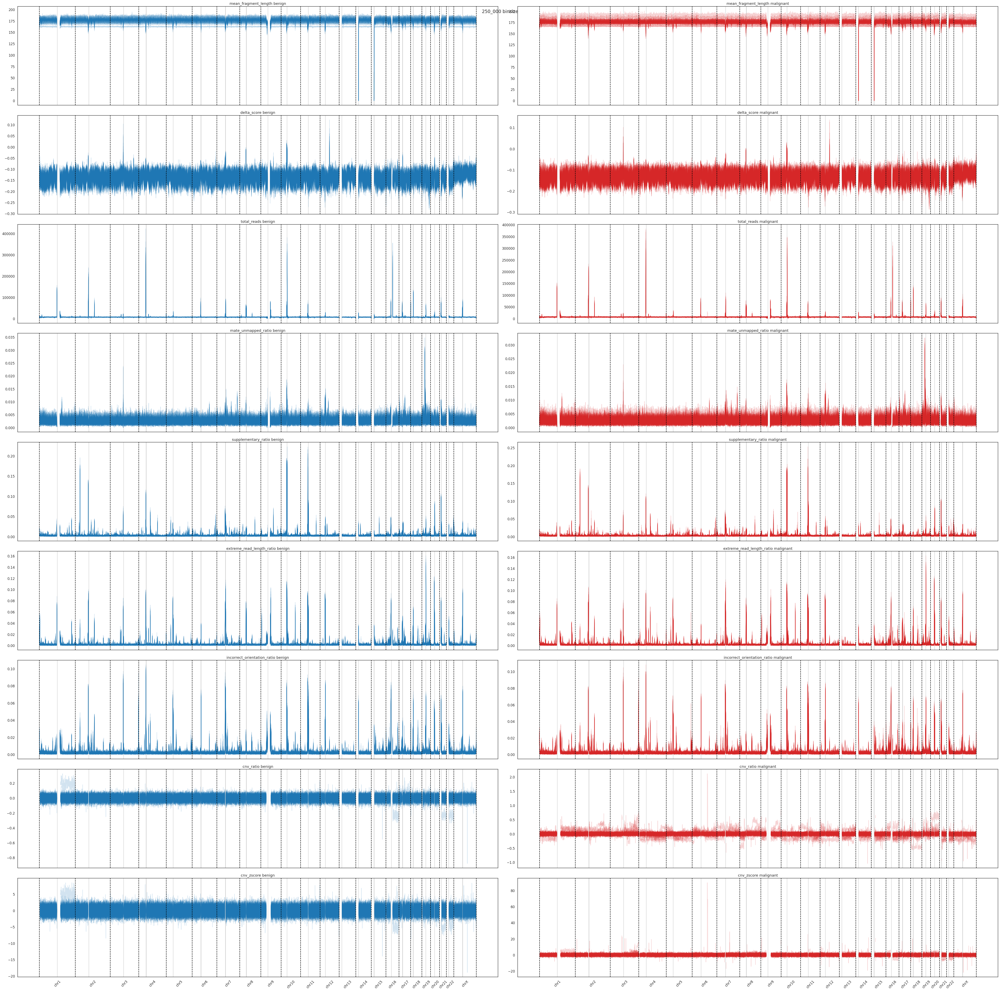

In [8]:
# plot the matrices on a 
fig, axs = plt.subplots(len(feature_names), 2, figsize=(50, 50), sharex=True)

# go through each row in feature matrix. if the row corresponds to a malignant sample, plot it in the right column, else plot it in the left column
for i, (feature_name, feature_matrix) in enumerate(feature_matrices.items()):
    feature_matrix = feature_matrix['masked_matrix']
    axs[i, 0].set_title(feature_name + ' benign')
    axs[i, 1].set_title(feature_name + ' malignant')
    for j, PGDXID in enumerate(feature_matrix.index):
        if data[PGDXID]['label'] == 'Malignant':
            axs[i, 1].plot(feature_matrix.loc[PGDXID, :].values, alpha=0.2, color='tab:red')
        else:
            axs[i, 0].plot(feature_matrix.loc[PGDXID, :].values, alpha=0.2, color='tab:blue')



#next for labeling the xaxis we need to know the number of bins for each chromosome.
# count the number of occurences of each chromosome in the sample_dfs[0]
df1 = data[PGDXID]['df']
chromosome_counts = df1.iloc[:, 0].value_counts().to_dict()
chromosome_ordered = df1.iloc[:, 0].unique().tolist()

# cumulatively sum the counts to get the end of each chromosome
chromosome_ends = np.cumsum([chromosome_counts[chromosome] for chromosome in chromosome_ordered])
chromosome_ends = np.insert(chromosome_ends, 0, 0)

# plot the chromosome ends as vertical lines over all the subplots
for chromosome_end in chromosome_ends:
    for ax in axs.ravel():
        ax.axvline(chromosome_end, color='black', linestyle='--')

# now we can plot the xaxis labels between the start and the end of each chromosome
# the start is the previous chromosome end, and the end is the current chromosome end using xtick labels
# set xticks to the middle of each chromosome
xticks = [(chromosome_ends[i] + chromosome_ends[i+1])/2 for i in range(len(chromosome_ends)-1)]
# set xtick labels to the chromosome names
xtick_labels = chromosome_ordered
# set xticks and xtick labels for each subplot
for ax in axs.ravel():
    ax.set_xticks(xticks)
    ax.set_xticklabels(xtick_labels, rotation=45)

## load centromere data
centromere_df = pd.read_csv('/home/d.gaillard/paired_ovarian/fragment_lengh_distibution/data/hg19_centromere.bed', sep='\t', header=None)
# drop last column
centromere_df = centromere_df.iloc[:, :-1]
# rename columns
centromere_df.columns = ['chromosome', 'start', 'end']

# draw lightgrey rectangles over the centromere regions for each chromosome first determine which bin contains the centromere start and end. then draw a rectangle over the corresponding xaxis region
for i, chromosome in enumerate(chromosome_ordered):
    centromere_start = centromere_df[centromere_df['chromosome'] == chromosome]['start'].values[0]
    centromere_end = centromere_df[centromere_df['chromosome'] == chromosome]['end'].values[0]

    # determine which row contains the centromere start and end
    start_row = np.where(df1.iloc[:, 1].values > centromere_start)[0][0] + chromosome_ends[i]
    end_row = np.where(df1.iloc[:, 2].values > centromere_end)[0][0] + chromosome_ends[i]
    # translate the start and end rows with the start of each chromsome

    # draw rectangle over the corresponding xaxis region, for each subplot. start counting
    for ax in axs.ravel():
        ax.axvspan(start_row, end_row+2, facecolor='black', alpha=0.2)
        


# for axrow in axs:
#     align_yaxes(axrow[0], axrow[1])

# for ax in axs[0,:]:
#     ax.set_ylim(150, 200)
# for ax in axs[1,:]:
#     ax.set_ylim(-0.25, 0.1)

fig.suptitle('250_000 binsize', fontsize=16)
fig.tight_layout()
plt.show()

    


mate_unmapped_ratio
(98, 11440)
supplementary_ratio
(98, 11440)
extreme_read_length_ratio
(98, 11440)
incorrect_orientation_ratio
(98, 11440)


/home/d.gaillard/miniconda3/envs/wgs/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


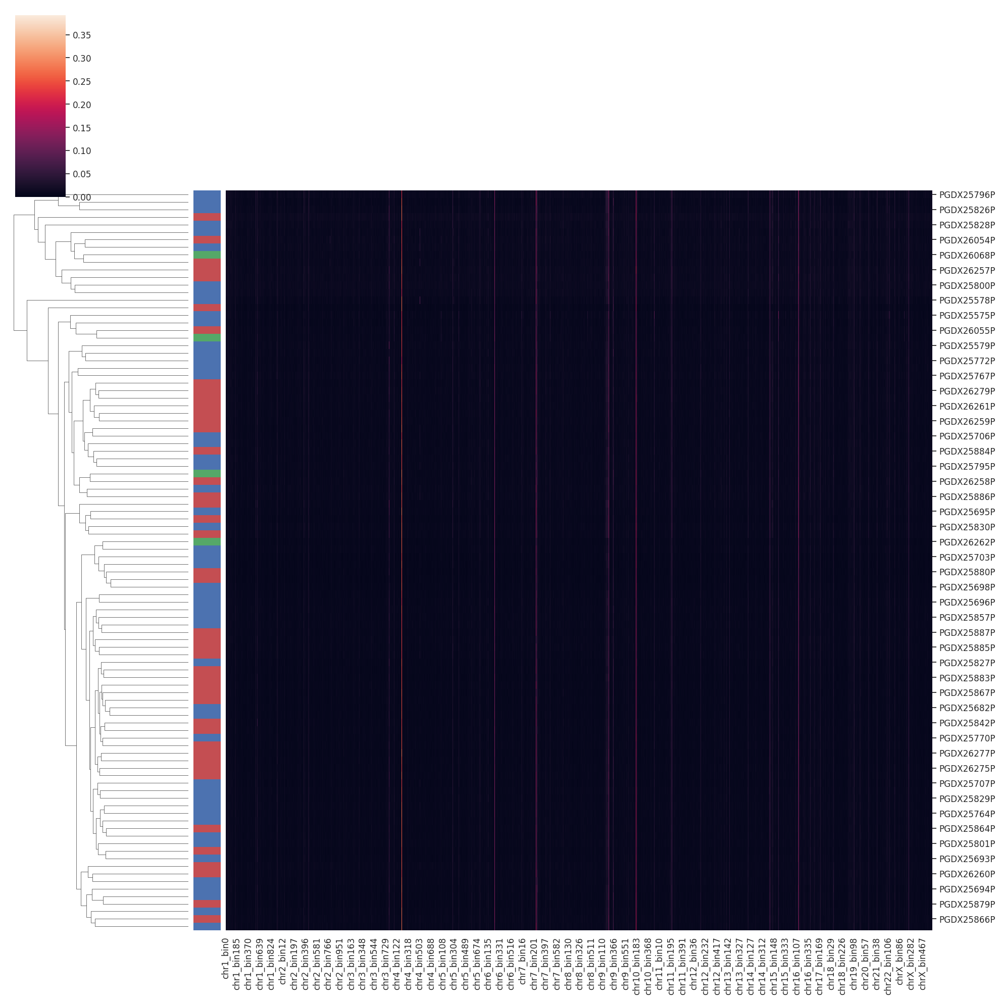

/home/d.gaillard/miniconda3/envs/wgs/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/d.gaillard/miniconda3/envs/wgs/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/d.gaillard/miniconda3/envs/wgs/lib/python3.9/site-packages/uma

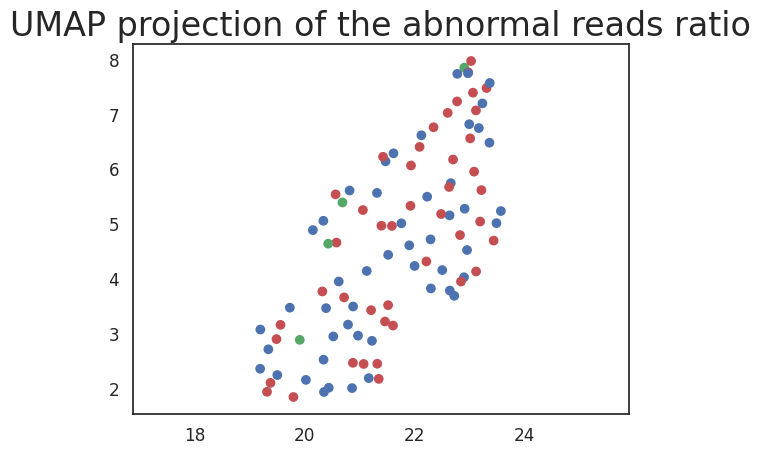

In [9]:
# # analyze supplementary reads, mate unmapped reads and reads with incorrect orientation or extreme read length
# check shape of each dataframe
for feature_name, feature_matrix in feature_matrices.items():
    feature_matrix = feature_matrix['deflated_matrix']
    if feature_name == 'supplementary_ratio' or feature_name == 'mate_unmapped_ratio' or feature_name == 'extreme_read_length_ratio' or feature_name == 'incorrect_orientation_ratio':
        print(feature_name)
        print(feature_matrix.shape)



# as all features are in ratios, we can just sum them up to get the ratio of abnormal reads per bin
abnormal_reads_ratio = np.zeros(feature_matrices['supplementary_ratio']['deflated_matrix'].shape)

for feature_name, feature_matrix in feature_matrices.items():
    feature_matrix = feature_matrix['deflated_matrix']
    if feature_name == 'supplementary_ratio' or feature_name == 'mate_unmapped_ratio' or feature_name == 'extreme_read_length_ratio' or feature_name == 'incorrect_orientation_ratio':
        abnormal_reads_ratio += feature_matrix.values

# convert to pandas for metadata tracking, get columns and index from supplementary_ratio matrix
abnormal_reads_ratio = pd.DataFrame(abnormal_reads_ratio, columns=feature_matrices['supplementary_ratio']['deflated_matrix'].columns, index=feature_matrices['supplementary_ratio']['deflated_matrix'].index)

# assert that sample order is the same as in the feature matrices
assert abnormal_reads_ratio.index.tolist() == feature_matrices['supplementary_ratio']['deflated_matrix'].index.tolist()

# get the labels for each sample
labels = pd.Series([data[PGDXID]['label'] for PGDXID in abnormal_reads_ratio.index])
lut = dict(zip(labels.unique(), "rbg"))
labels = pd.Series(labels).map(lut)

# plot the abnormal reads ratio in a seaborn clustermap, adding the labels as a row_colors argument, cluster only the rows
sns.clustermap(abnormal_reads_ratio, row_colors=[labels], figsize=(20, 20),col_cluster=False)
plt.show()

# use umap to cluster the samples on 2 dimensions
import umap
reducer = umap.UMAP()
embedding = reducer.fit_transform(abnormal_reads_ratio)

# plot the umap embedding with the labels as colors
plt.scatter(embedding[:, 0], embedding[:, 1], c=labels)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the abnormal reads ratio', fontsize=24)
plt.show()




In [11]:
pd.Series([data[PGDXID]['label'] for PGDXID in abnormal_reads_ratio.index])

0        Benign
1     Malignant
2        Benign
3     Malignant
4     Malignant
        ...    
93    Malignant
94       Benign
95    Malignant
96       Benign
97    Malignant
Length: 98, dtype: object

/home/d.gaillard/miniconda3/envs/wgs/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


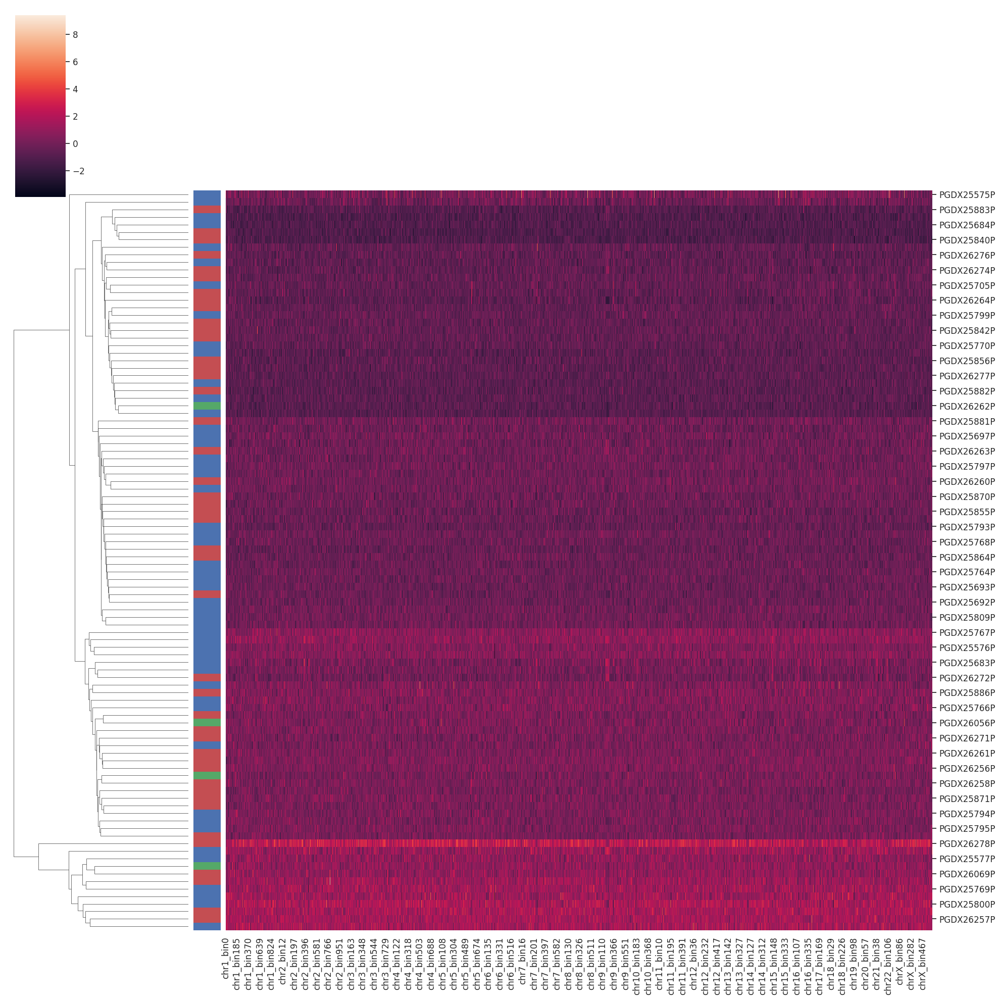

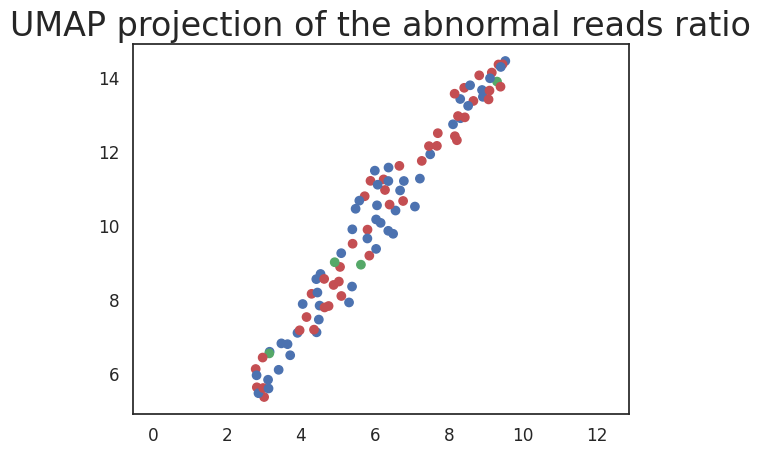

In [11]:
# give each column zero mean and unit variance
abnormal_reads_ratio = (abnormal_reads_ratio - abnormal_reads_ratio.mean()) / abnormal_reads_ratio.std()

# plot the abnormal reads ratio in a seaborn clustermap, adding the labels as a row_colors argument, cluster only the rows
sns.clustermap(abnormal_reads_ratio, row_colors=[labels], figsize=(20, 20),col_cluster=False)
plt.show()

# use umap to cluster the samples on 2 dimensions
import umap
reducer = umap.UMAP()
embedding = reducer.fit_transform(abnormal_reads_ratio)

# plot the umap embedding with the labels as colors
plt.scatter(embedding[:, 0], embedding[:, 1], c=labels)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the abnormal reads ratio', fontsize=24)
plt.show()



mate_unmapped_ratio
(98, 11440)
supplementary_ratio
(98, 11440)
extreme_read_length_ratio
(98, 11440)
incorrect_orientation_ratio
(98, 11440)


/home/d.gaillard/miniconda3/envs/wgs/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


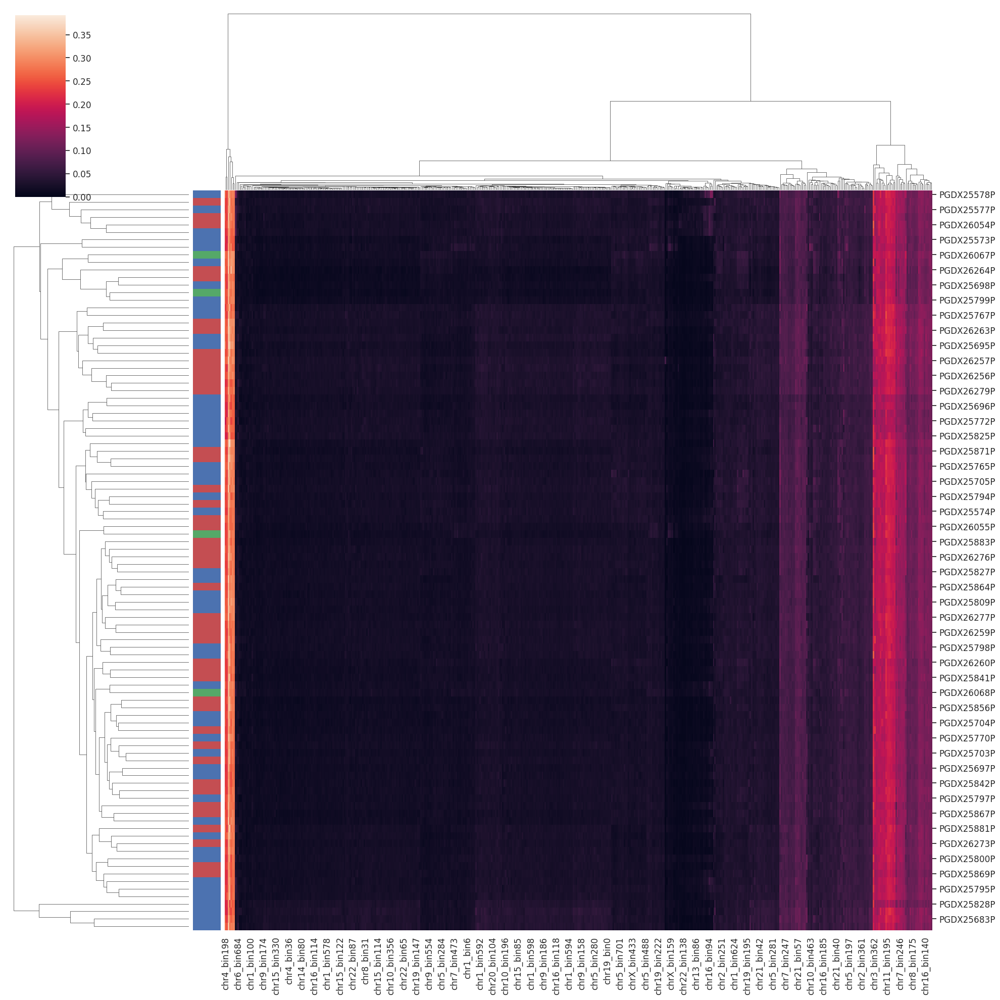

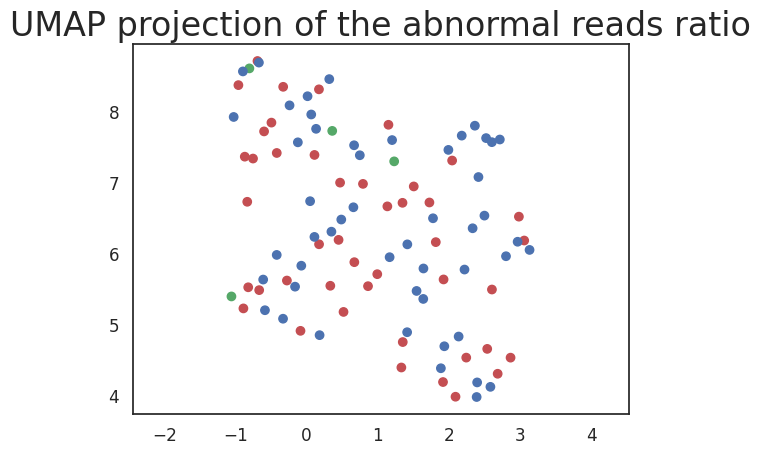

In [12]:


# # analyze supplementary reads, mate unmapped reads and reads with incorrect orientation or extreme read length
# check shape of each dataframe
for feature_name, feature_matrix in feature_matrices.items():
    feature_matrix = feature_matrix['deflated_matrix']
    if feature_name == 'supplementary_ratio' or feature_name == 'mate_unmapped_ratio' or feature_name == 'extreme_read_length_ratio' or feature_name == 'incorrect_orientation_ratio':
        print(feature_name)
        print(feature_matrix.shape)





# as all features are in ratios, we can just sum them up to get the ratio of abnormal reads per bin
abnormal_reads_ratio = np.zeros(feature_matrices['supplementary_ratio']['deflated_matrix'].shape)

for feature_name, feature_matrix in feature_matrices.items():
    feature_matrix = feature_matrix['deflated_matrix']
    if feature_name == 'supplementary_ratio' or feature_name == 'mate_unmapped_ratio' or feature_name == 'extreme_read_length_ratio' or feature_name == 'incorrect_orientation_ratio':
        abnormal_reads_ratio += feature_matrix.values

# convert to pandas for metadata tracking, get columns and index from supplementary_ratio matrix
abnormal_reads_ratio = pd.DataFrame(abnormal_reads_ratio, columns=feature_matrices['supplementary_ratio']['deflated_matrix'].columns, index=feature_matrices['supplementary_ratio']['deflated_matrix'].index)

# assert that sample order is the same as in the feature matrices
assert abnormal_reads_ratio.index.tolist() == feature_matrices['supplementary_ratio']['deflated_matrix'].index.tolist()

# select 1000 most variable bins (columns)
abnormal_reads_ratio = abnormal_reads_ratio[abnormal_reads_ratio.var(axis=0).sort_values(ascending=False).index[:500]]

# get the labels for each sample
labels = pd.Series([data[PGDXID]['label'] for PGDXID in abnormal_reads_ratio.index])
lut = dict(zip(labels.unique(), "rbg"))
labels = pd.Series(labels).map(lut)

# plot the abnormal reads ratio in a seaborn clustermap, adding the labels as a row_colors argument, cluster only the rows
sns.clustermap(abnormal_reads_ratio, row_colors=[labels], figsize=(20, 20))
plt.show()

# use umap to cluster the samples on 2 dimensions
import umap
reducer = umap.UMAP()
embedding = reducer.fit_transform(abnormal_reads_ratio)

# plot the umap embedding with the labels as colors
plt.scatter(embedding[:, 0], embedding[:, 1], c=labels)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the abnormal reads ratio', fontsize=24)
plt.show()




/home/d.gaillard/miniconda3/envs/wgs/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


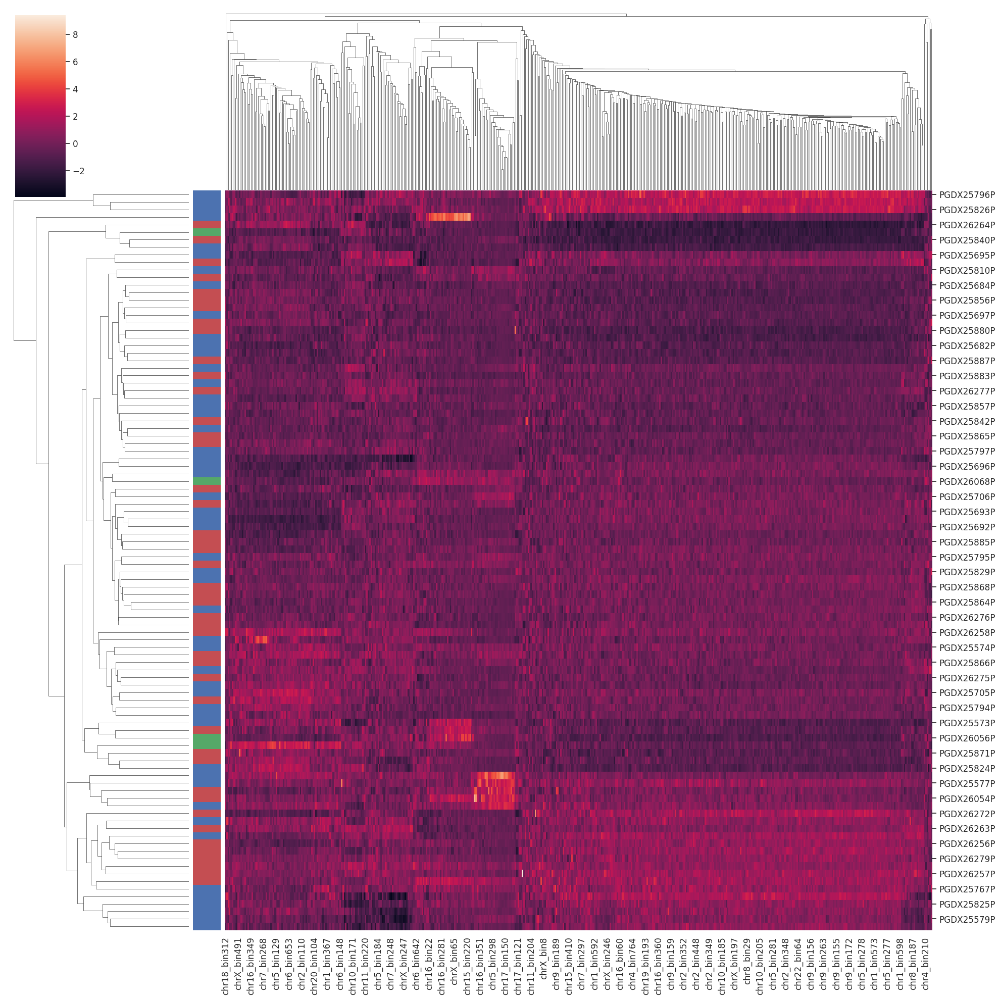

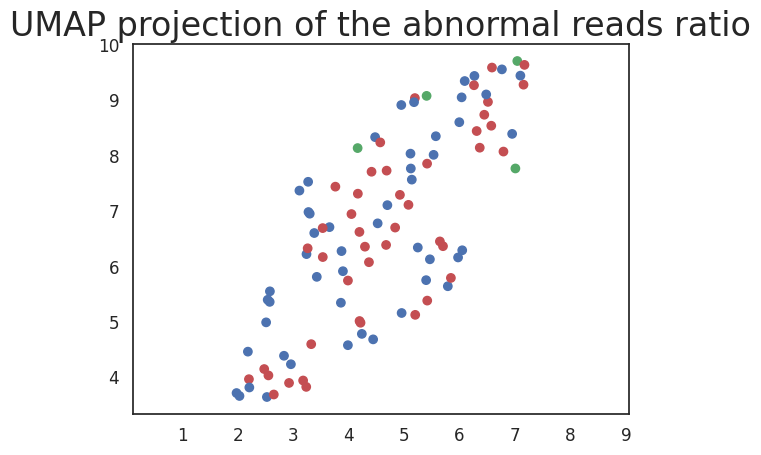

In [13]:
# give each column zero mean and unit variance
abnormal_reads_ratio = (abnormal_reads_ratio - abnormal_reads_ratio.mean()) / abnormal_reads_ratio.std()

# plot the abnormal reads ratio in a seaborn clustermap, adding the labels as a row_colors argument, cluster only the rows
sns.clustermap(abnormal_reads_ratio, row_colors=[labels], figsize=(20, 20))
plt.show()

# use umap to cluster the samples on 2 dimensions
import umap
reducer = umap.UMAP()
embedding = reducer.fit_transform(abnormal_reads_ratio)

# plot the umap embedding with the labels as colors
plt.scatter(embedding[:, 0], embedding[:, 1], c=labels)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the abnormal reads ratio', fontsize=24)
plt.show()



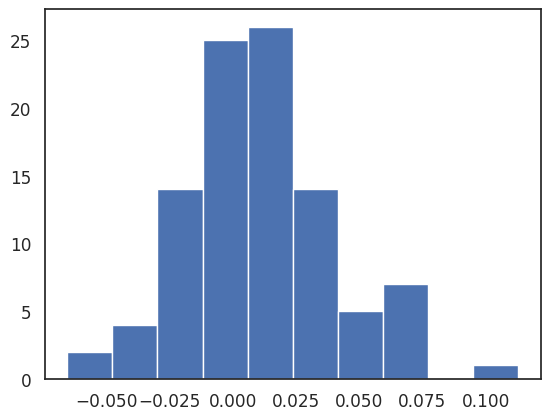

/home/d.gaillard/miniconda3/envs/wgs/lib/python3.9/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/home/d.gaillard/miniconda3/envs/wgs/lib/python3.9/site-packages/numpy/lib/function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


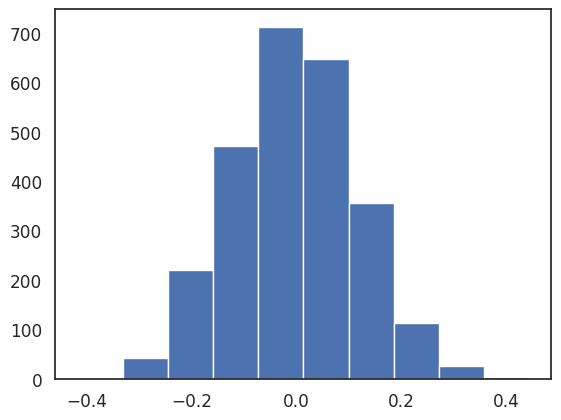

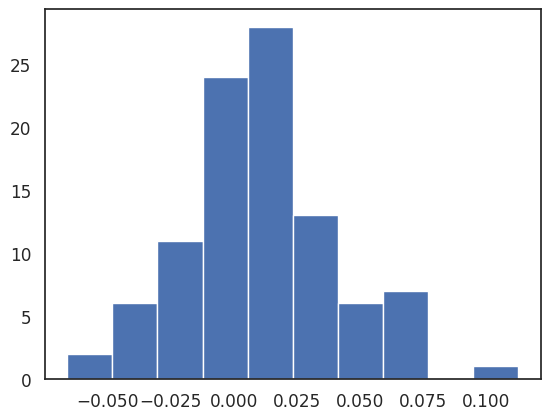

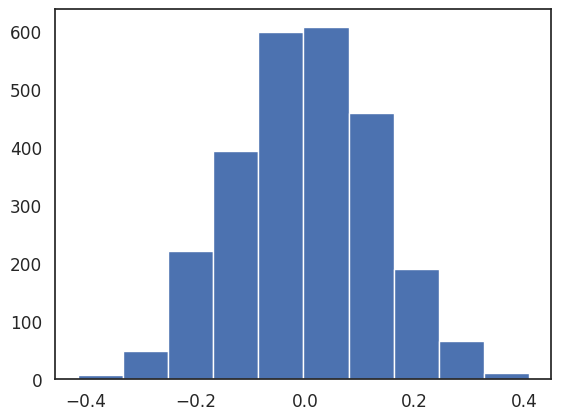

In [69]:
# next we calculate the correlation between the features and the cnv_ratio and cnv_zscore
# first we need to get the cnv_ratio and cnv_zscore for each bin
cnv_ratio_matrix = np.zeros((len(data), len(df1)))
cnv_zscore_matrix = np.zeros((len(data), len(df1)))
mean_fragment_length_matrix = np.zeros((len(data), len(df1)))
for i, PGDXID in enumerate(data.keys()):
    df = data[PGDXID]['df']
    cnv_ratio_matrix[i, :] = df['cnv_ratio'].values
    cnv_zscore_matrix[i, :] = df['cnv_zscore'].values
    mean_fragment_length_matrix[i, :] = df['mean_fragment_length'].values

# remove columns (bins) if any of the matrices contains a nan value. Do th
cnv_ratio_nans = np.isnan(cnv_ratio_matrix).any(axis=0)
cnv_zscore_nans = np.isnan(cnv_zscore_matrix).any(axis=0)
mean_fragment_length_matrix_nans = np.isnan(mean_fragment_length_matrix).any(axis=0)

# union of all the nans
nans = cnv_ratio_nans | cnv_zscore_nans | mean_fragment_length_matrix_nans

# remove the columns with nans
cnv_ratio_matrix = cnv_ratio_matrix[:, ~nans]
cnv_zscore_matrix = cnv_zscore_matrix[:, ~nans]
mean_fragment_length_matrix = mean_fragment_length_matrix[:, ~nans]

## cnv_ratio vs mean_fragment_length
# for each row (sample) calculate the correlation between the cnv_ratio and mean_fragment_length
cnv_ratio_mean_fragment_length_correlation = np.zeros(len(data))

for i in range(len(data)):
    cnv_ratio_mean_fragment_length_correlation[i] = np.corrcoef(cnv_ratio_matrix[i, :], mean_fragment_length_matrix[i, :])[0, 1]

# plot the correlation between the cnv_ratio and mean_fragment_length
plt.hist(cnv_ratio_mean_fragment_length_correlation)
plt.show()

# now for each column (bin) calculate the correlation between the cnv_ratio and mean_fragment_length
cnv_ratio_mean_fragment_length_correlation = np.zeros(cnv_ratio_matrix.shape[1])

for i in range(cnv_ratio_matrix.shape[1]):
    cnv_ratio_mean_fragment_length_correlation[i] = np.corrcoef(cnv_ratio_matrix[:, i], mean_fragment_length_matrix[:, i])[0, 1]

# plot the correlation between the cnv_ratio and mean_fragment_length
plt.hist(cnv_ratio_mean_fragment_length_correlation)
plt.show()

## cnv_zscore vs mean_fragment_length
# for each row (sample) calculate the correlation between the cnv_zscore and mean_fragment_length
cnv_zscore_mean_fragment_length_correlation = np.zeros(len(data))

for i in range(len(data)):
    cnv_zscore_mean_fragment_length_correlation[i] = np.corrcoef(cnv_zscore_matrix[i, :], mean_fragment_length_matrix[i, :])[0, 1]

# plot the correlation between the cnv_zscore and mean_fragment_length
plt.hist(cnv_zscore_mean_fragment_length_correlation)
plt.show()

# now for each column (bin) calculate the correlation between the cnv_zscore and mean_fragment_length
cnv_zscore_mean_fragment_length_correlation = np.zeros(cnv_zscore_matrix.shape[1])

for i in range(cnv_zscore_matrix.shape[1]):
    cnv_zscore_mean_fragment_length_correlation[i] = np.corrcoef(cnv_zscore_matrix[:, i], mean_fragment_length_matrix[:, i])[0, 1]

# plot the correlation between the cnv_zscore and mean_fragment_length
plt.hist(cnv_zscore_mean_fragment_length_correlation)
plt.show()

In [66]:
# we redo the code above but now we procedurally plot the correlation between the cnv_ratio and all other features



(2746,)